# PopAlign tutorial
### Aligning sample subpopulations to a reference model
This tutorial uses a dataset of Peripheral Blood Mononuclear Cells (PBMC) that includes one control (unperturbed) sample and 40 samples to which were added various drugs. The samples were multiplexed using multiSEQ (LMO tags). Cells were sequenced on 1xS4 lane of an Illumina NovaSeq machine and 33482 cells were successfully called based on their LMO tag levels.

### Imports

The user can install PopAlign with the following command:
```
pip install git+https://github.com/thomsonlab/popalign
```
We recommand to install the PopAlign package and its required dependencies in a dedicated environment (created with Anaconda for example). This package is built to run in Python 3 and will not run with Python 2.

After installing the PopAlign package with pip, the user can import it in their Python code:
```python
import popalign as PA
```

In [3]:
import sys
sys.path.append('../popalign/')
import popalign as PA
import importlib
from IPython.display import Image

### Load data

Our demultiplexing pipeline generates a folder with the following files: 
* matrix.mtx file : contains all single-cell data across all samples
* features.tsv: all gene symbols
* barcodes.tsv: all cell barcodes
* meta.tsv: metadata file 

The metadata file contains information about experimental conditions, on a per-cell basis. For each cell in the mtx file, there is a corresponding row in the metadata file containing different fields. The exact fields for each multiplexed dataset may be different, but all metadata files must contain 1) a "cell_barcode" field, 2) a "sample_id" field, and 3) a "sample_number" field.

Loading in data generates a data structure called `pop`. Pop will be passed along different functions in the pipeline, and stores all computed variables along the way. Initially, `pop` will contain the loaded data (`pop['samples']`), the gene names (`pop['genes']`) and an output folder name (`pop['outputfolder']`). 

When loading, you will also have the option to add new data into an existing pop object. If you want to do this, specify `existing_obj=X`, where X is an existing `pop` object.  

<!-- All the samples are stored in one unique matrix file. This format requires the paths to the .mtx file, the gene list, the barcode list and a metadata file. The meta data file must be a .csv file that includes two columns: `cell_barcode` and `sample_id`. The first column contains the cell barcodes and the second column contains the matching sample names for those cells. The cells from the different samples will be selected in the matrix based on their barcode index.

It returns a dictionary that contains the loaded data, genes and various information. That object is used throughout the entire analysis. The `outputfolder` parameter defines where the results of the analysis will be saved. Its default value is `output`.

If the user hasn't loaded any samples, `existing_obj` should be None. If samples have already been loaded with `load_samples` or `load_multiplexed`, the object that these functions returned should be given as the argument for this parameter. -->

The sample gene expression matrices are stored individually. To access the gene expression matrix of `sample1` for example, use the following:
```python
pop['samples']['sample1']['M']
```

Important: 
Please ensure that the provided gene names are formatted as official gene symbols (HGNC). Some custom references modify the gene symbols, which will cause downstream issues when performing GSEA or cell typing, which are steps that rely on gene label comparisons.

In [5]:
'''
Load data from a multiplexed experiment

Parameters
----------
matrix : str
    Path to a sparse matrix
barcodes : str
    Path to a .tsv 10X barcodes file
metafile : str
    Path to a metadata file. Must contains `cell_barcodes` and `sample_id` columns
genes : str
    Path to a .tsv 10X gene file. Optional if existing_obj is provided
outputfolder : str, optional
    Path (or name) of the output folder to create. default value is "output/"
existing_obj : dict, optional
    Object previously returned by either load_samples() or load_screen(). New samples will be added to that object
only : list, optional
    List of sample names to load (other samples with names not in list will not be loaded)
col : str, optional
    Name of a specific column in the meta data to use. Defaults to None
value : str or int, optional
    Value in the specified meta data column `col` to use to filter samples to load. Defaults to None
'''

pop = PA.load_multiplexed(matrix='../data/screen/PBMC-MULT-4/matrix.mtx', 
                     barcodes='../data/screen/PBMC-MULT-4/barcodes.tsv',
                     genes='../data/screen/PBMC-MULT-4/features.tsv',
                     metafile='../data/screen/PBMC-MULT-4/updated_meta.csv',
                     outputfolder='pbmc4_align_tutorial',
                     only=[],
                     col=None,
                     value=None,
                     existing_obj=None)

### Normalize and gene filter

Single cell gene expression data must be normalized to 1) account for the variation in the number of transcripts captured per cell and 2) balance the wide disparity in the scale of values across different genes due to measurement noise and gene drop-out.

The total number of transcripts captured for each single cell can vary from 1000 to 100,000 unique transcripts per cell. Technical variability in reagents and library prep steps can have a large impact on the number of transcripts retrieved per cell. To scale out these differences, we divide each gene expression value <em>g<sub>i</sub></em> by the total number and then multiply by a scaling factor <em>β</em>.

Additionally, across genes, mean transcript values can span 5 orders of magnitude. Transforming the data using the logarithm brings values across all genes close in scale, while also reducing the skew in data distributions. The equation for transforming a raw gene expression value <em>g<sub>i</sub></em> (for a single gene) into a normalized gene expression value <em>g'<sub>i</sub></em> is:

\begin{equation*}
g'_i = log(\beta \frac{g_i}{\sum_{i}^n g_i} + 1)
\end{equation*}

where n in the total number of genes, <em>β</em> is a scaling factor, and we add a 1 pseudo-count to each gene expression value.

If no scaling factor is provided, PopAlign automatically finds a <em>β</em> value that achieves a smooth transition in the distribution of tranformed<em>g'<sub>i</sub></em> when raw <em>g<sub>i</sub></em> values step from 0 to 1. 

The normalization function is:
```python
PA.normalize(pop, scaling_factor=None, ncells=None)


In [9]:
'''
Normalize the samples of object `pop` and applies a scaling factor

Parameters
----------
pop : dict
    Popalign object
scaling_factor : int or None, optional
    Number used to scale the data values. If None, that factor is computed automatically
ncells : int or None
    Number of cells to randomly subsample to try different normalization factors to use less memory. If None, all cells are used.
'''

PA.normalize(pop, scaling_factor=None, ncells=5000)

Performing column normalization
Finding best scaling factor


`plot_gene_filter()` is used to keep genes that are highly variable, i.e. non-Poisson. Genes which are randomly distributed according to a Poisson distribution will obey the following relationship: log(cv) ~ -1/2* log(mean). However, genes which are highly variable will have a CV that falls above that line. To find these genes, we make a scatterplot of all genes [log(cv) vs log(mean)] and then fit the line by linear regression. All genes above the line are kept for further analysis. You can provide an offset value that shifts the line upwards, thus increasing the stringency of the filter. This log(cv) vs log(mean) plot is displayed, displaying the line used for thresholding genes, and is also stored in the output folder in the `qc` subfolder. 

In [ ]:
'''
Plot genes by their log(mean) and log(coefficient of variation)
Can be used multiple times to find best offset. Every time the function is run,
the indices of the genes above the fitted line are stored in the pop object.

Parameters
----------
offset: float
    Value (its log) will be added to the intercept of the linear fit to filter genes
'''

PA.plot_gene_filter(pop, offset=1)

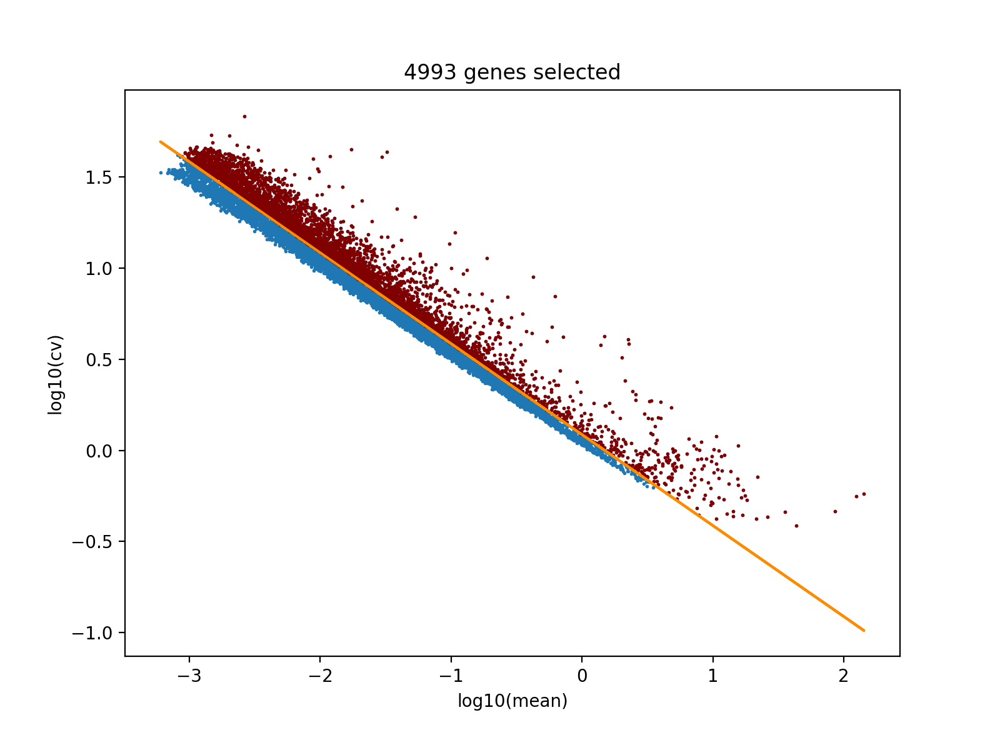

In [115]:
Image(filename='pbmc4_align_tutorial/qc/gene_filtering.png', width=500)

The `filter()` function is used to filter the data using the last indices retrieved using the `plot_gene_filter()` function. If set to `True`, `remove_ribsomal` and `remove_mitochondrial` will respectively remove genes starting with `RPS` and `RPL`, and genes starting with `MT-`.
This function filters out the genes and then logs the data values in all gene expression matrices. The filtered matrices are stored under a different entry. The filtered matrix of `sample1` is accessed with:
```python
pop['samples']['sample1']['M_norm']
```
The non-gene filtered matrices are also logged in-place (`pop['samples']['sample1']['M']`).  
The list of filtered genes can now be accessed with:
```python
pop['filtered_genes']
```

In [11]:
'''
Filter genes from data in `pop`
Can discard ribosomal genes that start with RPS or RPL
Can discard mitochondrial genes that start with MT-

Parameters
----------
pop :dict
    Popalign object
remove_ribsomal : bool
    Wether to remove or not the ribosomal genes
remove_mitochondrial : bool
    Wether to remove or not the mitochondrial geneset
'''
PA.filter(pop, remove_ribsomal=True, remove_mitochondrial=True)

Removing ribosomal and/or mitochondrial genes
Filtering genes ang logging data



### Dimensionality reduction

Once we have filtered out the uninformative genes, we compress the remaining data into a low-dimensional space defined by gene expression features or programs. Briefly, we can represent the transcriptional state of each single cell as a linear combination of gene expression feature vectors, {*__w__<sub>i</sub>*}:

\begin{equation*}
g = \sum_{i=1}^m c_i \mathbf{w}_i
\end{equation*}

where <em>__w<sub>i</sub>__</em> ∈ &#8477;<sup>n</sup> specifies a gene expression feature, and __c<sub>i</sub>__ is a coefficient that encodes the weighting of vector *__w<sub>i</sub>__* in *__g__*, the gene expression state of single cell. In matrix form, this equation is: *__D ≈ W C__*, where *__D__* is a matrix with gene expression vectors in the rows: *{g<sub>1</sub>, g<sub>2</sub>, ..., g<sub>n</sub>}*.
The gene features, {*__w__<sub>i</sub>*} can be extracted using a wide range of matrix factorization and machine learning techniques. Here we primarily use features derived from principal components analysis (PCA), or non-negative matrix factorization, NMF.

### NMF

Standard non-negative matrix factorization has been shown to provide a useful set of features for gene expression analysis because feature vectors have positive entries, and so we can naturally think about the gene expression state of a cell, *__g__*, as being assembled as a linear sum of positive gene expression programs. We like to use a particular version of NMF that imposes an orthogonality constraint on $W$ --> $W^TW = I$. This orthogonality constraint pushes the optimization procedure to learn modular features which are non-overlapping with each other. Factorization occurs through minimization of an objective function with positivity and orthogonality constraints. We implement our own version of an optimization algorithm developed by Li and Ngom [1] 

The `onmf()` function in PopAlign buils multiple feature spaces and picks the feature space that minimizes the mean square error between the original data and the reconstructed version of the data using the feature space:
\begin{equation*}
min||D-WC||_{2}
\end{equation*}


To access the feature space:
```python
pop['W']
```

Gene set enrichment analysis (GSEA) is run for each feature from the feature space. The feature labels can be found under:
```python
pop['top_feat_labels']
```

To acess the top 20 gene set labels assigned to each feature:
```python
pop['feat_labels']
```

To access the feature space data of sample1:
```python
pop['samples']['sample1']['C']
```

[1] Y. Li and A. Ngom, "The non-negative matrix factorization toolbox for biological data mining," BMC Source Code for Biology and Medicine, vol 8, pp. 10, April 2013

In [ ]:
'''
Compute feature spaces and minimize the reconstruction error to pick a final feature space
Run Gene Set Enrichment Analysis (GSEA)

Parameters
----------
pop : dict
    Popalign object
ncells : int
    Number of cells to use
nfeats : int or list of ints
    Number(s) of features to use
nreps : int
    Number of repetitions to perform for each k in nfeats
niter : int
    Maximum number of iterations to
    perform for each instance of the algoirthm
'''
importlib.reload(PA)
PA.onmf(pop, ncells=5000, nfeats=[7,9], nreps=3, niter=500)

The dimensionality reduction step saves a plot (shown below) that highlights the performance of oNMF. For each feature, the top genes are retrieved (genes with a feature value greater than twice the feature's standard deviation). A gene list is created using the top genes of all features, and a genes by features heatmap is created. The features should show orthogonality, with minimal gene overlap.

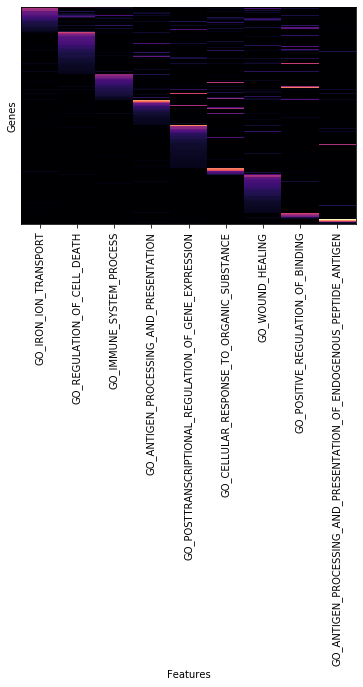

In [116]:
Image(filename='pbmc4_align_tutorial/qc/topgenes_features.png')

### Displaying t-SNE and UMAPs in an arrayed grid plot

Nonlinear dimensionality reduction methods like t-SNE and UMAP are a common way to visualize single-cell data in a 2D plane*. To visualize our data in a t-sne or UMAP plot, we use the `samples_grid()` function. The function runs either t-SNE or UMAP and saves a grid plot that displays samples individually in the t-SNE or UMAP space, with the other samples as background. This visualization can be very useful to identify unique subpopulations in samples, or overlapping subpopulations between samples. The plot is saved in the output folder, in the `embedding` and `samples` subfolders.

*Nonlinear embeddings like t-SNE and UMAP are not strictly distance preserving and can produce significant distortions [2], so they are not suitable for learning probability models or performing computations in which relative distance is important. 

[2] Shamus M. Cooley, Timothy Hamilton, Eric J. Deeds, J. Christian J. Ray. A novel metric reveals previously unrecognized distortion in dimensionality reduction of scRNA-Seq data. bioRxiv 689851; doi: https://doi.org/10.1101/689851

In [19]:
'''
Generate a grid plot of sample plots in an embedding space

Parameters
----------
pop : dict
    Popalign object
method : str
    Embedding method. One of tsne, umap
figsize : tuple
    Figure size
size_background : float, int
    Point size for the embedding scatter in the background
size_samples : float, int
    Point size for the highlighted samples
'''

PA.samples_grid(pop, method='tsne', figsize=(20,20))

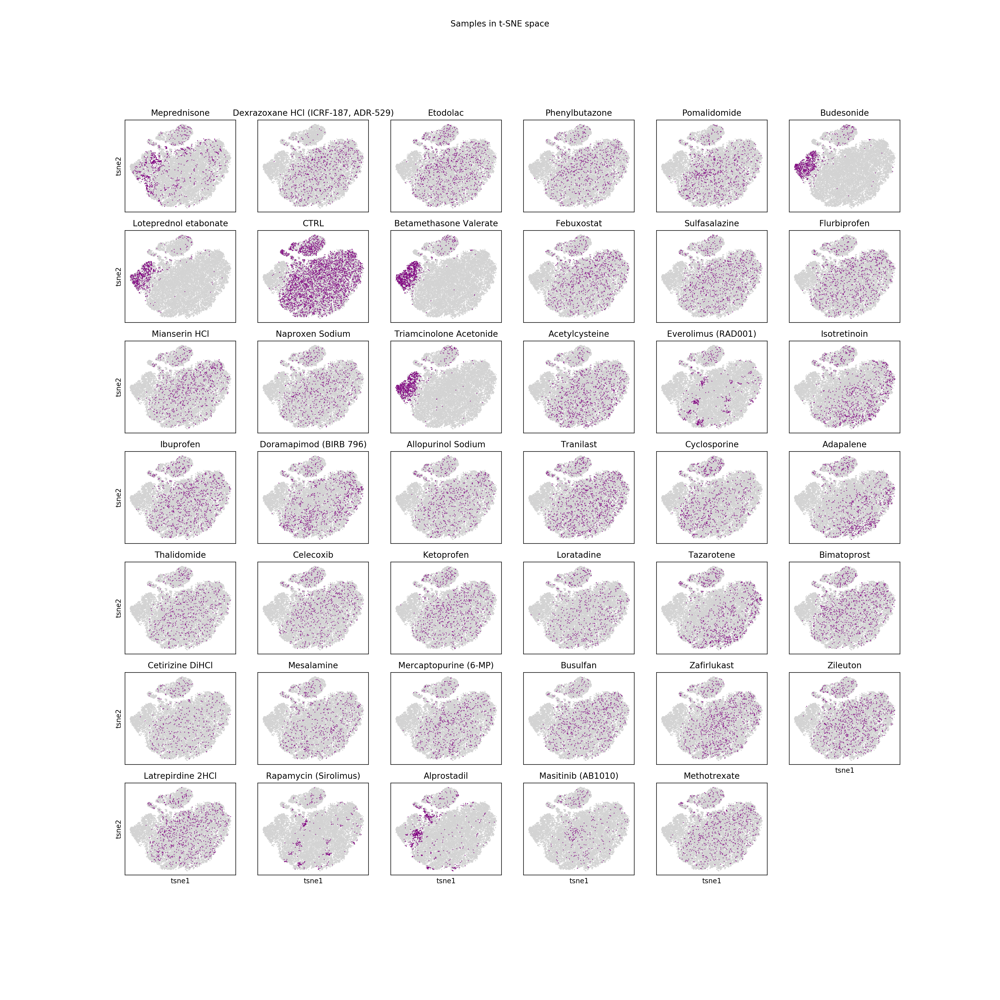

In [100]:
Image(filename='pbmc4_align_tutorial/embedding/samples/embedding_grid_tsne.png')

### Build probabilistic models

In the PopAlign framework, we use probabilistic models to compare samples at a global level and also at a subpopulation specific level. We model the probability density of all samples in gene expression space using a Gaussian Mixture Model (GMM).  A Gaussian mixture model fits an entire population using local Gaussian densities, which describe individual subpopulations. Each Gaussian density contains the following parameters: 

* $\mu$ - mean: mean of the density (vector of length n).
* $\Sigma$ - covariance matrix: spread and shape of the density (n by n matrix).
* $w$ - weight: probability that an observation comes from this density (float).

With Gaussian mixture models, a common problem is how to choose k, the number of Gaussians to use in the model. The PopAlign function `build_gmms()` finds the best model for each sample by sweeping over a range of k (input by the user), and finding the best model based on the Bayesian Information Criterion (BIC). The model that minimizes the BIC score is kept. For each given sample, we split the sample data into a training set and a validation set. The training set is used to fit the GMMs and the validation set is used to calculate the BIC. The size of the training set is set using the `training` argument, and the remaining cells will be used for the validation set.

PopAlign also gives the option to store multiple models for each sample through the `nreplicates` argument. Each model is built using a different sample of training and validation data. This allows us to boostrap downstream computations (such as the $\Delta\mu$ metric) and achieve error estimates non-parametrically. 

To access the GMM of `sample1`:
```python
pop['samples']['sample1']['gmm']
```


### Cell Typing

We implemented a very simple cell typing procedure to identify the cell type of a population. In this procedure, we type each cell individually based on expression of marker genes. Each cell type must be supplied with its own set of unique markers. We recommend limiting markers to 2-4 highly informative genes. We use min-max normalization to normalize the expression range of each gene, and compute the average expression level per cell type for each cell. Each cell is assigned to the type for which it has maximum marker expression. Then we label each subpopulation (Gaussian component) with the type associated with the majority of cells within that subpopulation.

This simple procedure works well for populations which have very clear marker genes. However we recommend using other methods in cases where cell types are not well described by single marker genes. 

```python
pop['samples']['sample1']['gmm_types']
```

In [17]:
'''
Build a Gaussian Mixture Model on feature projected data for each sample
Type model populations

Parameters
----------
pop : dict
    Popalign object
ks : int or tuple
    Number or range of components to use
niters : int
    number of replicates to build for each k in `ks`
training : int or float
    If training is float, the value will be used a percentage to select cells for the training set. Must follow 0<value<1
    If training is int, that number of cells will be used for the training set.
nreplicates : int
    Number of replicates to generate. These replicates model will be used to provide confidence intervals later in the analysis.
reg_covar : str or float
    If 'auto', the regularization value will be computed from the feature data
    If float, value will be used as reg_covar parameter to build GMMs
rendering : str
    One of grouped, individual
types : dict, str or None
    Dictionary of cell types. Keys should be cell types labels and values should be lists of valid genes
    If None, a default PBMC cell types dictionary is provided
figsizegrouped : tuple, optional
    Size of the figure for the renderings together. Default is (20,20)
figsizesingle : tuple, optional
    Size of the figure for each single sample rendering. Default is (5,5)
only: list or str, optional
    Sample label or list of sample labels. Will force GMM construction for specified samples only. Defaults to None
'''

importlib.reload(PA)
PA.build_gmms(pop, 
              ks=(3,12), 
              niters=2,
              training=.8, 
              nreplicates=0,
              reg_covar='auto', 
              rendering='grouped', 
              types='defaultpbmc', # either None, 'defaultpbmc' or a dictionary
              figsizegrouped=(20,20),
              figsizesingle=(6,5),
              only=None)

Building model for Meprednisone (1 of 41)
Building model for Dexrazoxane HCl (ICRF-187, ADR-529) (2 of 41)
Building model for Etodolac (3 of 41)
Building model for Phenylbutazone (4 of 41)
Building model for Pomalidomide (5 of 41)
Building model for Budesonide (6 of 41)
Building model for Loteprednol etabonate (7 of 41)
Building model for CTRL (8 of 41)
Building model for Betamethasone Valerate (9 of 41)
Building model for Febuxostat (10 of 41)
Building model for Sulfasalazine (11 of 41)
Building model for Flurbiprofen (12 of 41)
Building model for Mianserin HCl (13 of 41)
Building model for Naproxen Sodium (14 of 41)
Building model for Triamcinolone Acetonide (15 of 41)
Building model for Acetylcysteine (16 of 41)
Building model for Everolimus (RAD001) (17 of 41)
Building model for Isotretinoin (18 of 41)
Building model for Ibuprofen (19 of 41)
Building model for Doramapimod (BIRB 796) (20 of 41)
Building model for Allopurinol Sodium (21 of 41)
Building model for Tranilast (22 of 41)


After modeling all samples, `build_gmms()` renders the models by projecting the densities from the n-dimensional space to a 2-dimensional PCA space. The rendering plots are saved within the output folder, in the `renderings` subfolder.

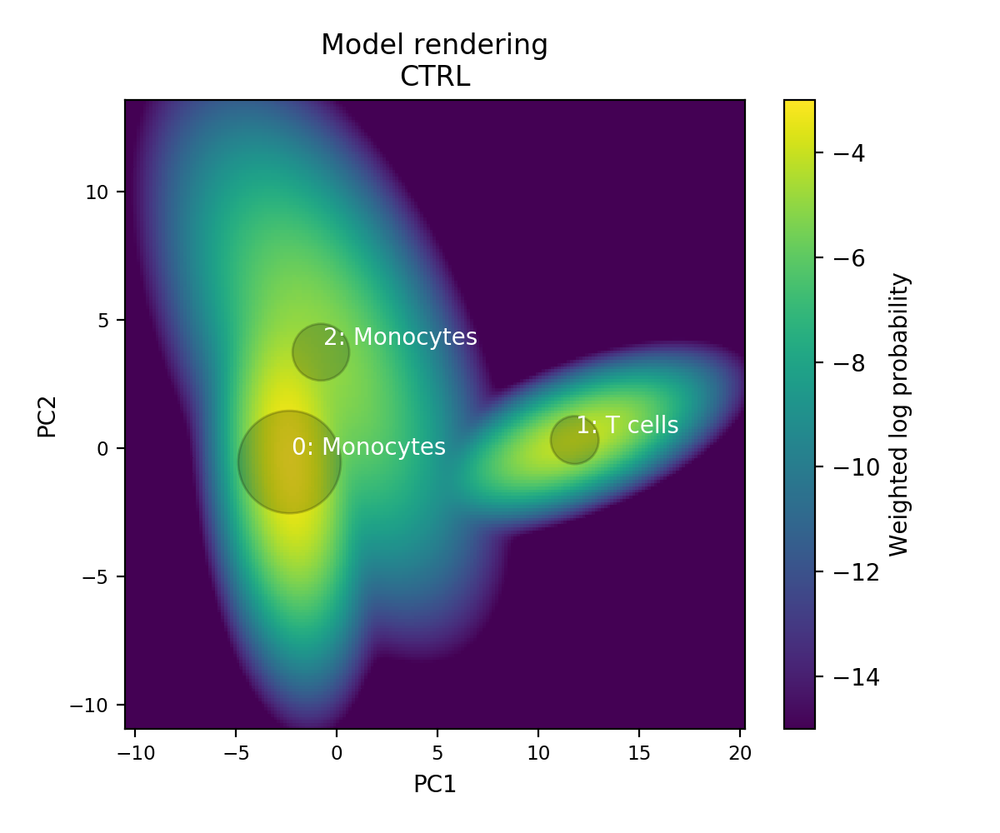

In [101]:
Image(filename='pbmc4_align_tutorial/renderings/model_rendering_CTRL.png', retina=1)

A grid plot displaying all the individual renderings is also generated and saved in the `renderings` subfolder.

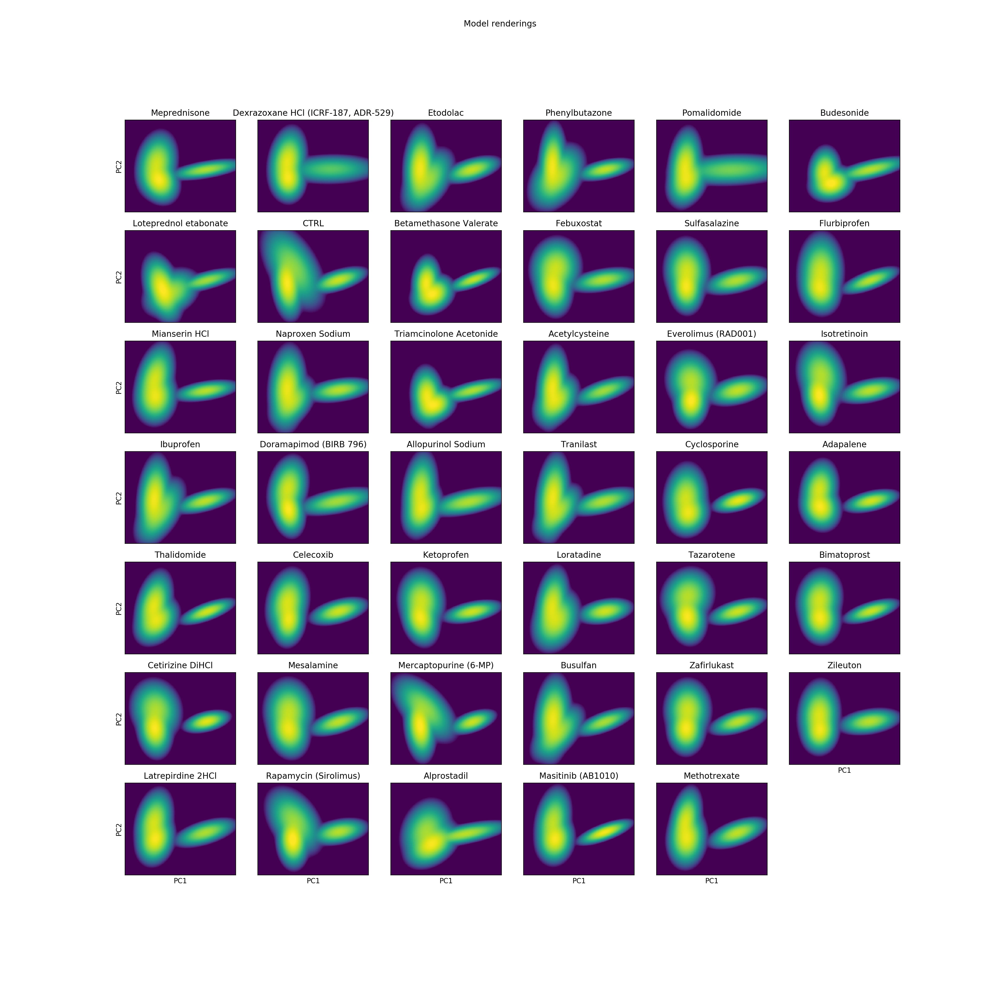

In [102]:
Image(filename='pbmc4_align_tutorial/renderings/model_rendering_allsamples.png')

In [ ]:
# If the renderings do not have the right figure size, regenerate the renderings with:
'''
Parameters
----------
pop : dict
    Popalign object
figsizegrouped : tuple
    Figure size for the grid rendering plotof all samples together
figsizesingle : tuple
    Figure size of an individual sample rendering plot
mode : str
    One of grouped, individual or unique.
    Grouped will render the models individually and together in a separate grid
    Inidividual will only render the models individually
    Unique will render the data's unique model
'''
importlib.reload(PA)
PA.render_models(pop, figsizegrouped=(30,30), samples=order, figsizesingle=(6,5), mode='grouped')

### Align subpopulations

To compare subpopulations directly across samples, we perform an "alignment" step to infer the subpopulations (i.e. independent Gaussians) that are likely to be related to each other. We make the assumption that subpopulations which are closest in statistical distance (i.e. they have the smallest divergence relative to each other) are most likely to be related. In this step, we use the Jeffrey divergence because it is symmetric and it has an analytic form for a pair of Gaussians. 

`align()` aligns all sample models to a single reference model (usually a control sample). When aligning a sample model to a reference model, the Jeffrey divergences are computed for the possible pairs of Gaussian densities between the two models. The alignment step matches population pairs that minimizes the Jeffrey divergence(s). This minimization can be performed using three settings:
* conservative: Two Gaussian densities are aligned to each other only when they are each other's best match (minimal Jeffrey divergence)
* Test to reference: Each Gaussian density from a sample model gets aligned to its most significant reference Gaussian density (Two sample densities can be aligned to the same reference component).
* Reference to test: Each Gaussian density from the reference model gets aligned to its most significant sample density (Two reference densities can be aligned to the same sample component)

The pairwise Jeffrey divergences between `sample1` and the reference sample model can be found under:
```python
pop['samples']['sample1']['fullalignments']
```
In that matrix, the values are Jeffrey divergences, the rows are the sample densities and the columns are the reference densities.

To access the alignments found depending on the selecting method, use:
```python
pop['samples']['sample1']['alignments']
```
In that array, the first column represents the sample density number, the second column stores the reference density number and the third column stores the Jeffrey divergence between the two densities.

In [36]:
'''
Align the components of each sample's model to the components of a reference model

Parameters
----------
pop : dict
    Popalign object
ref : str
    Name of reference sample
method : str
    Method to perform the alignment
    If 'conservative', the reference component and the test component have to be each other's best match to align
    If 'test2ref', the closest reference component is found for each test component
    If 'ref2test', the closest test component is found for each test component
figsizedeltas : tuple, optional
    Size of the figure for the delta plot. Default is (10,5)
figsizeentropy : tuple, optional
    Size of the figure for the entropy plot. Default is (10,5)
'''
importlib.reload(PA)
PA.align(pop, ref='CTRL',
         method='test2ref', # one of: test2ref, ref2test, conservative
         figsizedeltas=(10,10),
         figsizeentropy=(10,10))

### Quantifying shifts in abundance, gene expression, and covariance 


After aligning the subpopulations across samples, we can generate delta plots that quantify shifts in the parameters $\mu$, $w$, and $\Sigma$. The shift in the mean gene expression state is given by $\Delta\mu$, while the change in abundance is given by $\Deltaw$. We also compute the change in the population shape - $\Delta\Sigma$ but this parameter does not often have a straightforward interpretation.

$\Delta\mu$ : Euclidean distance between sample density mean and reference density mean. 
$\Deltaw$ : $w$ - $w_{ref}$
$\Delta\Sigma$ : covariance distance metric given in Forstner [3]

[3] Förstner, Wolfgang, and Boudewijn Moonen. "A metric for covariance matrices." Geodesy-The Challenge of the 3rd Millennium. Springer, Berlin, Heidelberg, 2003. 299-309.

Each delta plot is generated for a specific subpopulation (Gaussian density) in the reference sample. A delta plot for a given reference density shows only the different sample densities that aligned to that reference density.

Shown below is an example of a delta mu / delta w plot, sorted by delta mu. We can easily identify a few samples for which subpopulations diverge from the reference #0 Monocytes density: the four samples with the largest delta mus (far right on the plot) were exposed to glucocorticoid drugs. These drugs have the most significant effect on monocytes in terms of gene expression shifts ($\Delta\mu$)

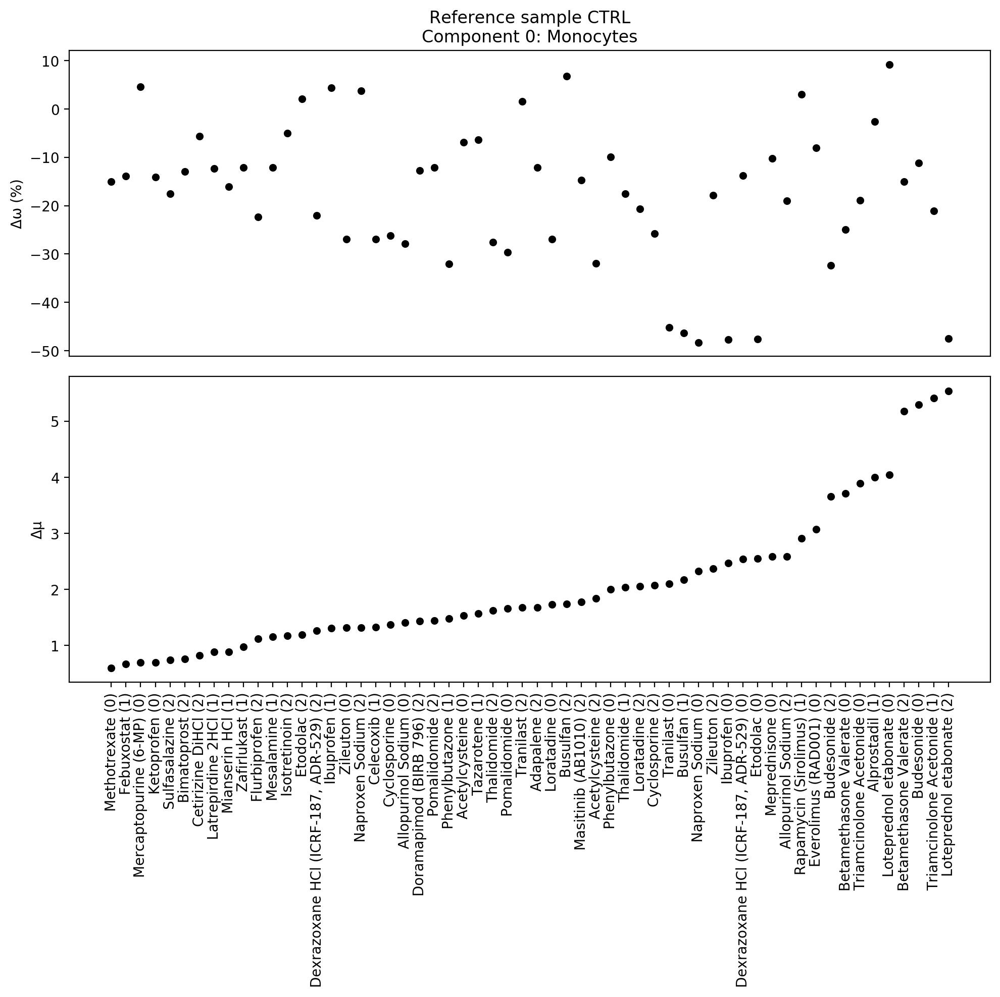

In [103]:
Image(filename='pbmc4_align_tutorial/deltas/deltas_comp0_Monocytes.png', width=600)

In the example above, we can see that glucocorticoid PBMC samples have high $\Delta\mu$'s with their alignments against the monocyte component of the reference sample (control sample). 

### Differential Expression using L1-error metric

In the example above, we can see that glucocorticoid PBMC samples have large shifts in the monocyte component (high $\Delta\mu$'s in components that align to the monocyte component of the reference sample). 

To explore the genes that give rise to these large transcriptional shifts in latent space, we use the `diffexp()` function to find the differentially expressed genes between our Loteprednol etabonate sample and our control sample. 

The diffexp function works by ranking genes based on differences in the distribution between the two subpopulations. For each gene we compute an L1-error metric by computing two histograms (one for each subpopulation) and then calculating the L1-norm between the resulting probability vectors. The L1-error metric is given a sign based on the difference in the median value between distributions. L1-error metrics can range in value from -2 to 2, with an absolute value of 2 denoting completely non-overlapping histograms. Practically, we never see values reaching the limit for single-cell gene expression data. 

A cutoff value  is used to select genes that are differentially expressed (significant L1-norm values). `diffexp()` returns a list of selected genes whose abs(L1-error)>cutoff. 


In [79]:
'''
Find  differentially expressed genes between a refernce subpopulation
and the subpopulation of a sample that aligned to it

Parameters
----------
pop : dict
    Popalign object
refcomp : int
    Subpopulation number of the reference sample's GMM
sample : str
    Name of the sample to compare
nbins : int, optional
    Number of histogram bins to use
nleft : int
    Number of underexpressed genes to retrieve
nright : int
    Number of overexpressed genes to retrieve
renderhists : bool
    Render histograms or not for the top differentially expressed genes
usefiltered : bool
    Wether to use filtered genes or not. If False, all genes will be used to run the differential expression
'''
importlib.reload(PA)
refcomp = 0
testcomp = 2
sample = 'Loteprednol etabonate'
genelist = PA.diffexp(pop,
                      refcomp=refcomp,
                      testcomp=testcomp,
                      sample=sample,
                      nbins=20,
                      cutoff=.8,
                      renderhists=True,
                      usefiltered=True,
                      equalncells=False,
                      figsize=(20,20))

`diffexp()` creates a subfolder called `diffexp` and creates a subfolder for each differential expression analysis run between a reference density and a sample density that aligned to it. You can find in that subfolder the sorted L1-norm values plot, which shows the proportion of significant L1-norm values. 

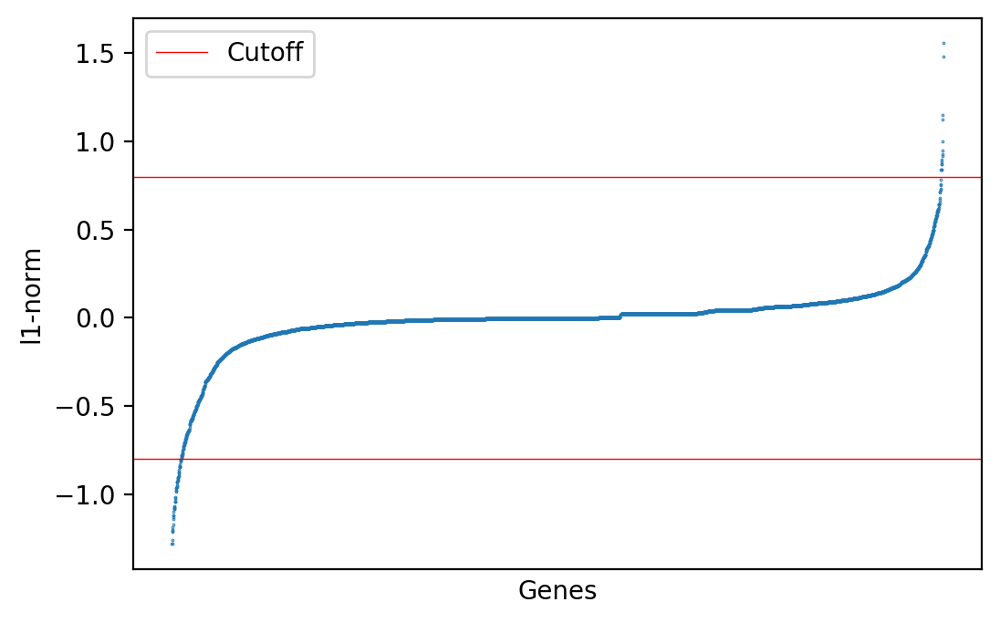

In [104]:
Image(filename='pbmc4_align_tutorial/diffexp/0_Loteprednol etabonate/l1norm_values.png', width=500)

Genes are selected based on the chosen cutoff value. If `renderhists` is set to `True`, the top genes histogram plots are generated and saved in a `hists` subfolder. A prefix in the file name indices if the gene is upregulated or downregulated in the test sample.

We show below the histogram plot for gene CD163:

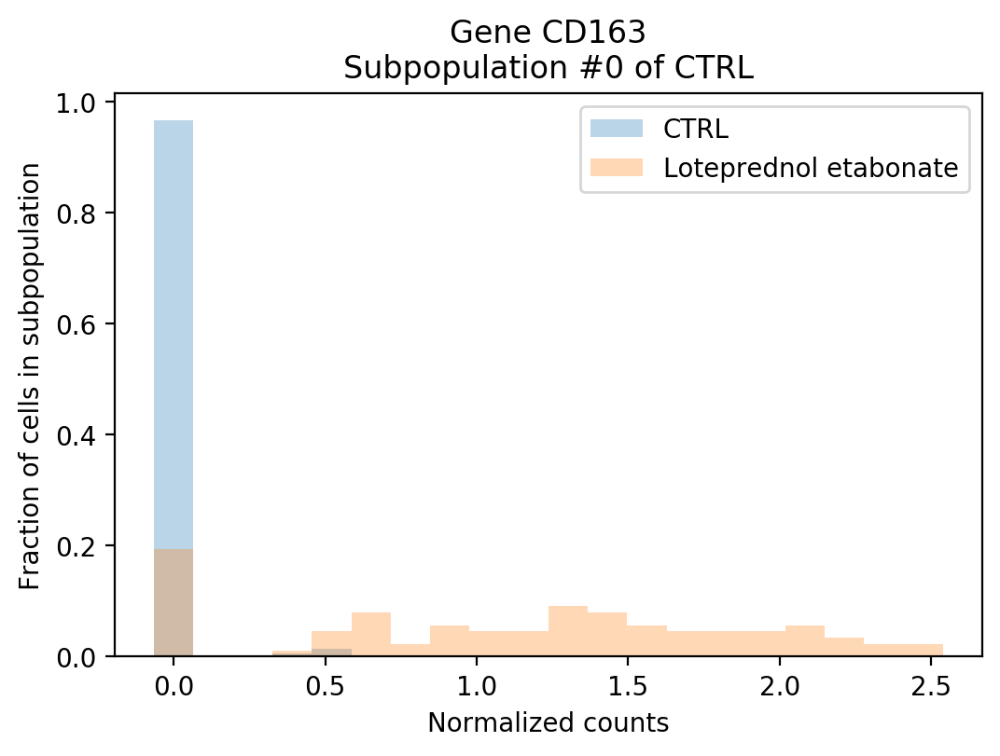

In [105]:
Image(filename='pbmc4_align_tutorial/diffexp/0_Loteprednol etabonate/hists/upregulated_CD163.png', width=500)

GSEA is run on the downregulated genes, as well as the upregulated genes. The results are stored in files called `downregulated_genes.txt` and `upregulated_genes.txt`. If we take a look at the latter for Loteprednol etabonate's monocyte subpoplation example, we can see that the matching genesets from GSEA are:

GO_RESPONSE_TO_CALCIUM_ION
GO_RESPONSE_TO_CARBOHYDRATE
GO_RESPONSE_TO_PROGESTERONE
GO_REGULATION_OF_CERAMIDE_BIOSYNTHETIC_PROCESS
GO_POSITIVE_REGULATION_OF_MEMBRANE_DEPOLARIZATION
GO_NEGATIVE_REGULATION_OF_ENDOPLASMIC_RETICULUM_UNFOLDED_PROTEIN_RESPONSE
GO_POSITIVE_REGULATION_OF_MACROPHAGE_CHEMOTAXIS
GO_POSITIVE_REGULATION_OF_FIBROBLAST_MIGRATION
GO_REGULATION_OF_OXIDATIVE_STRESS_INDUCED_NEURON_DEATH
GO_PROTEIN_FOLDING_IN_ENDOPLASMIC_RETICULUM
GO_NEGATIVE_REGULATION_OF_FIBROBLAST_GROWTH_FACTOR_RECEPTOR_SIGNALING_PATHWAY
GO_SEQUESTERING_OF_METAL_ION
GO_CELLULAR_RESPONSE_TO_ATP
GO_POSITIVE_REGULATION_OF_MACROPHAGE_ACTIVATION
GO_PROTEIN_O_LINKED_FUCOSYLATION
GO_RESPONSE_TO_METAL_ION
GO_LIPOXYGENASE_PATHWAY
GO_BEHAVIORAL_RESPONSE_TO_PAIN
GO_REGULATION_OF_MEMBRANE_LIPID_METABOLIC_PROCESS
GO_POSITIVE_REGULATION_OF_CELLULAR_AMIDE_METABOLIC_PROCESS

Some of these genesets, like GO_RESPONSE_TO_METAL_ION, are specific to M2 macrophages, induced by glucocorticoid drugs.

A gene expression heatmap is also generated, displaying the selected genes from most downregulated to most upregulated, for the given density of a sample that aligned to the reference density. Each column in the heatmap represents a cell from one of the densities.

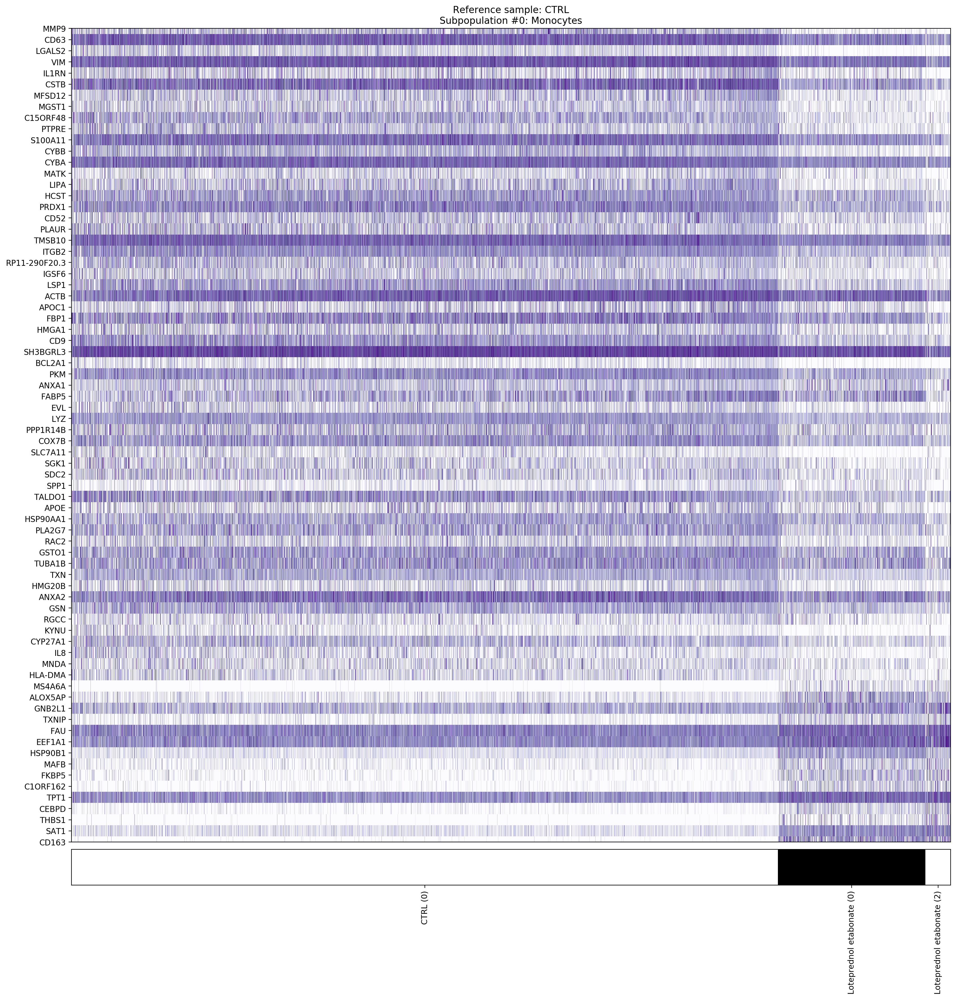

In [106]:
Image(filename='pbmc4_align_tutorial/diffexp/0_Loteprednol etabonate/0_Loteprednol etabonate_only.png', width=600)

`diffexp()` automatically creates a heatmap from the list of differentially expressed genes that it finds. The `plot_heatmap` function can be used to generate similar heatmaps.

In [ ]:
'''
Plot specific genes for cells of a reference subpopulation S and subpopulations that aligned to S

Parameters
----------
pop : dict
    Popalign dict
refcomp : int
    Reference subpopulation number
genelist : list
    List of genes to plot
clustersamples : bool
    Cluster the samples
clustercells : bool
    Cluster the cells within each sample subpopulation
savename : str, optional
    The user can specify a name for the file to be written. When savename is None, a filename is computed with the reference component number. Default is None
figsize : tuple, optional
    Size of the figure. Default is (15,15)
cmap : str, optional
    Name of the Matplotlib colormap to use. Default is Purples
samplelimits : bool, optional
    Wether to draw vertical lines on the heatmap to visually separate cells from different samples
scalegenes : bool, optional
    Wether to scale the genes by substracting the min and dividing by the max for each gene
only: str, optional
    Sample label
equalncells: bool, optional
    Randomly subsets cells so that subpopulations have the same number of cells
'''

PA.plot_heatmap(pop,
                refcomp=refcomp,
                genelist=genelist,
                clustersamples=True,
                clustercells=False,
                savename='%d_%s' % (refcomp,sample) ,# either None or a string
                figsize=(20,20),
                cmap='Purples',
                samplelimits=False,
                scalegenes=True,
                only=None,
                equalncells=False)

### Rank samples

PopAlign can rank samples against one reference sample. In this example, we want to rank our samples against our control sample, composed of PBMCs with no additional drug. We use the model that was generated for that sample as our reference model. For each other sample in the experiment, we randomly subsample cells and score them against the reference model. The log-likelihood score gives an indication of how likely the cells are to have been generated from the reference model's distribution. 

We also have the option to generate a log-likelihood ratio score, which is defined by:

\begin{equation*}
LLR = log(\frac{L(\theta_{ref}|C)}{L(\theta_{test}|C)})
\end{equation*}

Where C is a set of cells from the test sample, and θ<sub>ref</sub> and θ<sub>test</sub> respectively designate the reference model parameters and the test model parameters.

Each sample is subsampled `niter` times, to provide statistical significance to the scoring step. We can sort the samples using their average log-likelihood (or log-likelihood ratio) score. The ranking plot is saved in the `rankings` subfolder.

In [26]:
'''
Generate a ranking plot of the samples against a reference model

Parameters
----------
pop : dict
    Popalign object
ref : str
    Reference sample name
k : int
    Number of random cells to use
niter : int
    Number of iterations to perform
method : str
    Scoring method to use. 'LLR' for log-likelihood ratio, 'LL' for log-likelihood.
mincells : int
    If a sample has less than `mincells` cells, is discarded
figsize : tuple, optional
    Size of the figure. Default is (10,5)
'''

PA.rank(pop,
        ref='CTRL', # label of the reference sample
        k=100, # number of cells to randomly sample from sample
        niter=200, # number of iterations
        method='LLR', # LLR for log-likelihood ratio or LL for log-likelihood
        mincells=50, # sample's minimum number of cells to be ranked
        figsize=(10,5)) # plot figure size

The ranking plot shown below also emphasizes on the strong impact that glucocorticoid drugs have on PBMCs (four samples far left on the plot).

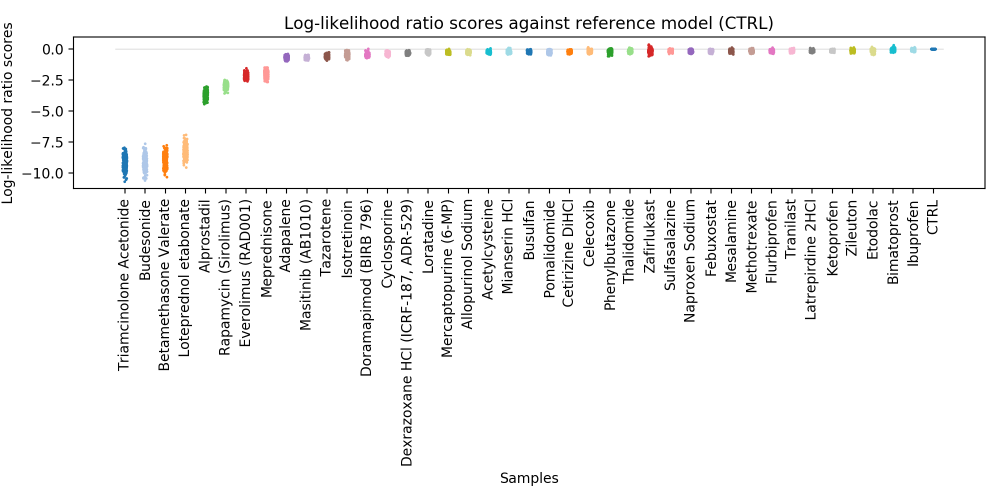

In [107]:
Image(filename='pbmc4_align_tutorial/ranking/LLR_rankings_stripplot.png')

### 2D visualization

PopAlign has a `scatter()` function that allows to highlight marker gene expression levels for all the data, or for a specific sample if wanted. This function has a method parameter, that enables the user to choose between t-SNE and UMAP embedding methods. If the embedded coordinates do not exist yet, they will be generated. The plots are saved in the `embedding/markers/` subfolder.

In [33]:
'''
Run an embedding algorithm and plot the data in a scatter plot
Higlight specific gene expression

pop: dict
    Popalign object
method : str
    Embedding method. One of umap, tsne. Defaults to tsne
sample: str, optional
    Highlight specified sample
compnumber: int, optional
    Component number of specified sample
marker : str
    Valid gene name. Defaults to None
size : float or int
    Point size. Defaults to .1
'''
PA.scatter(pop, method='tsne', marker='CD3D')
PA.scatter(pop, method='tsne', marker='LYZ')
PA.scatter(pop, method='tsne', marker='CD163')
PA.scatter(pop, method='tsne', sample='Budesonide', marker='CD163')

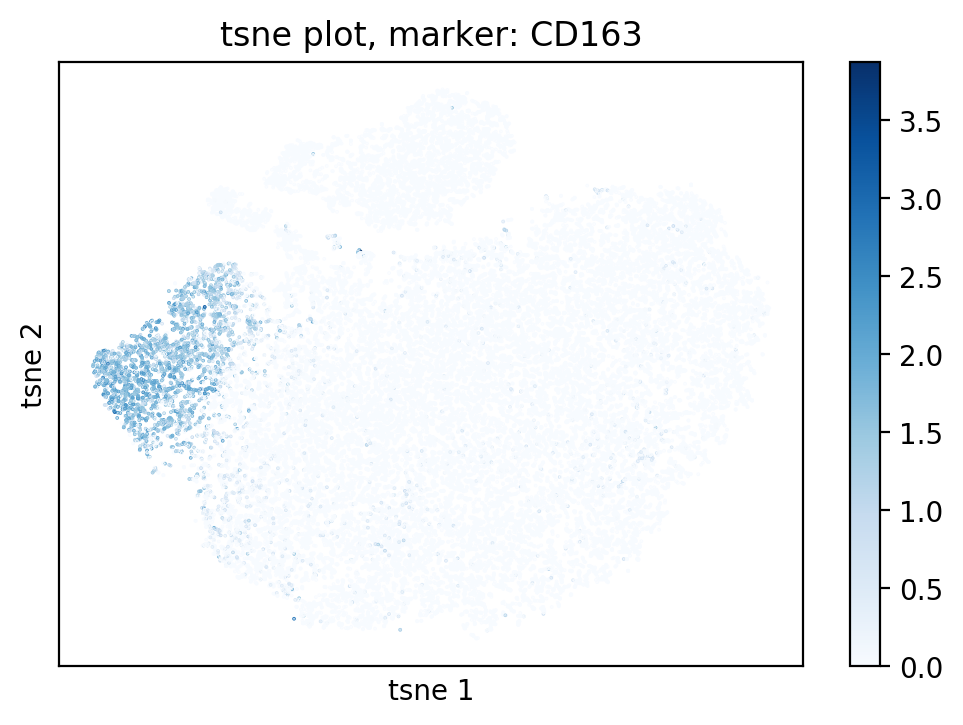

In [97]:
Image(filename='pbmc4_align_tutorial/embedding/markers/tsne_CD163.png', width=500)

In [108]:
'''
Generate a grid plot of sample plots in an embedding space

Parameters
----------
pop : dict
    Popalign object
method : str
    Embedding method. One of tsne, umap
figsize : tuple
    Figure size
size_background : float, int
    Point size for the embedding scatter in the background
size_samples : float, int
    Point size for the highlighted samples
'''

PA.samples_grid(pop, method='tsne', figsize=(20,20))
PA.samples_grid(pop, method='umap', figsize=(20,20))

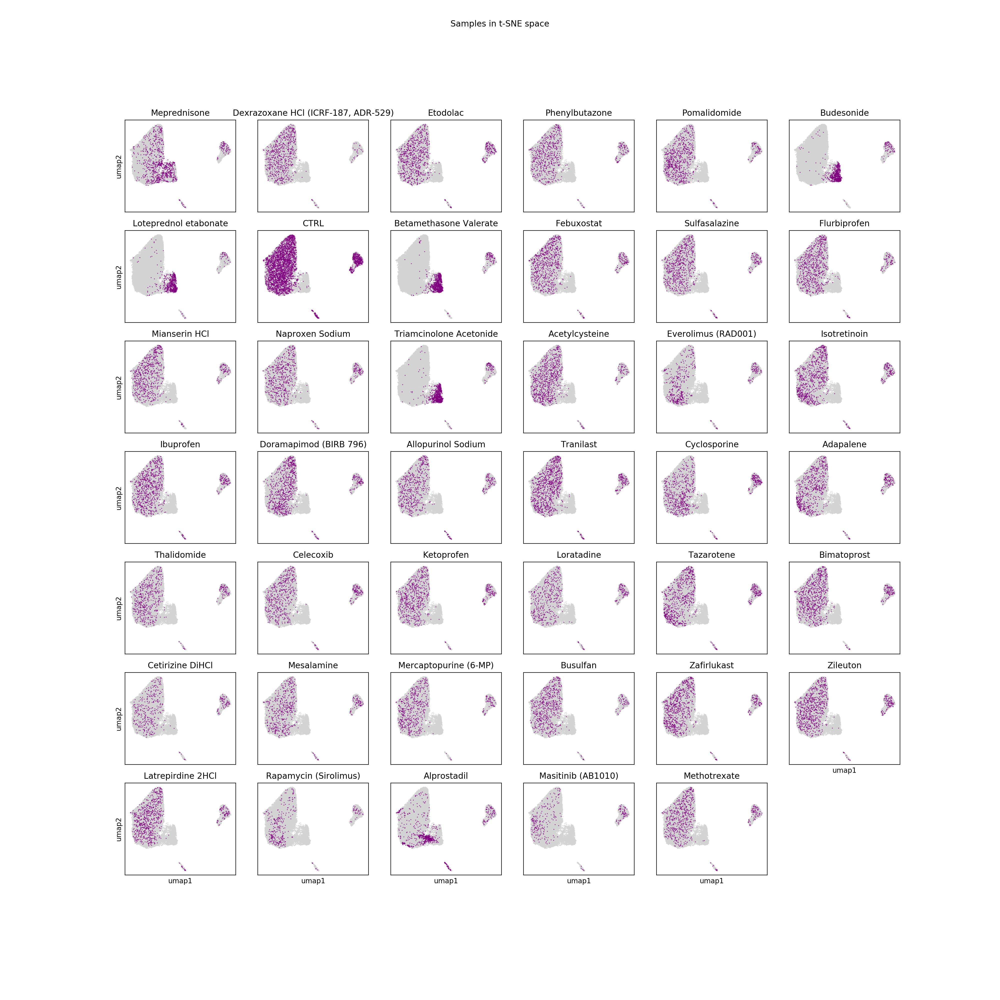

In [117]:
Image(filename='pbmc4_align_tutorial/embedding/samples/embedding_grid_umap.png')

### 3D visualization

In [ ]:
# Interactive 3D visualization of the data in feature space
importlib.reload(PA)
import plotly
plotly.offline.init_notebook_mode()
PA.plotfeatures(pop)